# Defacing pre-registration - Statistical analysis on image quality metrics (IQMs)

In [247]:
#Helper function to plot IQMs distribution per site and per defacing condition
plot_iqms <- function(df){
    library(ggplot2)
    library(tidyr)
    library(dplyr)

    df_long <- as.data.frame(df) %>%
    pivot_longer(cols = setdiff(colnames(df), c('site','sub', 'defaced', 'X', 'bids_name')),
                names_to = "IQM",
                values_to = "value")

    df_long$defaced <- factor(df_long$defaced, levels = c(0, 1), labels = c("NonDefaced", "Defaced"))

    p <- ggplot(df_long, aes(x = defaced , y = value, group = defaced)) +
    geom_violinhalf(aes(fill = as.factor(defaced)), trim = FALSE, scale = "count", alpha = 0.6, flip=c(0,1)) +
    stat_summary(fun = quantile, fun.args = list(probs = c(0.5)), geom = "crossbar", width=1, color="white") +
    stat_summary(fun = quantile, fun.args = list(probs = c(0.25, 0.75)), geom = "crossbar", width=1, color="white", linetype="dashed") +
    geom_line(aes(group = sub), color = 'gray', alpha = 0.5) +
    geom_point(position = position_jitter(width = 0.05), alpha = 0.6) +
    labs(title = "Distribution of Image Quality Metrics by Site",
        x = "Site",
        y = "Value") +
    theme_minimal() +
    theme(text = element_text(size = 22)) +
    theme(legend.position = "none") +
    facet_wrap(~ interaction(site, IQM), scales = "free", ncol=6)

    print(p)
}

## Load IQMs dataframe

The dataframe has been put together by running `load_iqms.py`

In [248]:
iqms_df <- read.csv(file = 'IXI_iqms_df.csv')
nrow(iqms_df)
head(iqms_df)

[1] 1238

,X,bids_name,cjv,cnr,efc,fber,fwhm_avg,fwhm_x,fwhm_y,fwhm_z,⋯,summary_wm_p05,summary_wm_p95,summary_wm_stdv,tpm_overlap_csf,tpm_overlap_gm,tpm_overlap_wm,wm2max,sub,defaced,site
,<int>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<int>,<int>
1,0,sub-0001_T1w,0.6351147,1.6188323,0.6832394,-1.00,4.240132,3.472429,4.962027,4.285941,⋯,842.8749,1043.732,60.78839,0.2147993,0.5246370,0.5626394,0.6926824,177,1,1
2,1,sub-0002_T1w,0.6749731,1.3523271,0.6640146,-1.00,4.262446,3.506165,5.044864,4.236309,⋯,787.1783,1042.586,78.65390,0.1973404,0.5138491,0.5512521,0.5869213,579,1,1
3,2,sub-0003_T1w,0.8371993,1.0600009,0.6746202,-1.00,4.292906,3.512552,5.043467,4.322699,⋯,784.6245,1040.245,79.16497,0.1887645,0.4927368,0.5362885,0.5872222,627,1,1
4,3,sub-0004_T1w,0.7456791,1.4405708,0.6466036,-1.00,5.152780,4.426159,5.761077,5.271104,⋯,859.4581,1038.193,54.14839,0.2157620,0.5261246,0.5416698,0.7060296,256,1,0
5,4,sub-0005_T1w,0.9225658,0.9250182,0.6372921,11137.17,5.721108,5.785896,5.829574,5.547853,⋯,840.8978,1067.566,69.23093,0.2262715,0.5027414,0.5440808,0.3316002,543,1,2
6,5,sub-0006_T1w,0.6262369,1.5753367,0.6362573,-1.00,4.265999,3.562763,4.988129,4.247105,⋯,805.5794,1038.692,71.85468,0.1875314,0.5236145,0.5604504,0.6344376,40,0,1


Some subject were selected to be repeated twice in the dataset. The problem is that multRM cannot deal with repeated subjects,
so we have to delete one repetition of those subjects and defaced combination. We do it randomly to give some confidence to the reader
that we did not cherry-pick IQMs.

In [249]:
library(dplyr)
#Set seed as we mentioned in the pre-registration to ensure replicability
day <- 220830
time <- 543417
set.seed(day+time)

# When two IQMs correspond to the same defaced status and subject, we keep only one of them
iqms_df <- iqms_df %>%
  group_by(sub, defaced) %>%
  sample_n(size = 1)

nrow(iqms_df)

[1] 1158

#### Problem in the IQMs
qi_1 and summary_bg_p05 are 0 for all images
summary_bg_mad and summary_bg_median are always 0 except for two images
fber is very often -1, indicating there is no signal outside of the head mask
Thus, we remove those IQMs from further analysis

In [250]:
iqms_df <- subset(iqms_df, select = -c(qi_1, summary_bg_p05, summary_bg_mad, summary_bg_median))

nrow(iqms_df)
head(iqms_df)

[1] 1158

X,bids_name,cjv,cnr,efc,fber,fwhm_avg,fwhm_x,fwhm_y,fwhm_z,⋯,summary_wm_p05,summary_wm_p95,summary_wm_stdv,tpm_overlap_csf,tpm_overlap_gm,tpm_overlap_wm,wm2max,sub,defaced,site
<int>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<int>,<int>
440,sub-0444_T1w,0.5861675,1.846902,0.6474383,-1.00,4.375916,3.642051,5.158219,4.327477,⋯,856.5075,1042.092,56.32668,0.2168017,0.5322781,0.5601872,0.6982362,2,0,1
346,sub-0349_T1w,0.5852294,1.851069,0.6658212,-1.00,4.371343,3.636068,5.151627,4.326336,⋯,856.6094,1042.230,56.31117,0.2191862,0.5337883,0.5610296,0.7032770,2,1,1
276,sub-0279_T1w,0.6465274,1.563155,0.5780979,31760.57,5.366370,4.591303,6.315563,5.192245,⋯,868.0517,1040.118,51.90385,0.2184856,0.5159899,0.5475882,0.8309842,12,0,0
224,sub-0226_T1w,0.6426790,1.581272,0.6058435,-1.00,5.362434,4.585095,6.310389,5.191819,⋯,869.8782,1039.969,51.29705,0.2156502,0.5141284,0.5467387,0.8318491,12,1,0
999,sub-1003_T1w,0.7218579,1.337184,0.5865544,-1.00,5.216103,4.494911,6.039051,5.114347,⋯,843.0950,1040.828,60.87288,0.1968965,0.5047372,0.5480396,0.7592740,13,0,0
1098,sub-1102_T1w,0.7193691,1.347444,0.6105431,-1.00,5.221943,4.480036,6.046315,5.139477,⋯,845.0431,1040.784,60.17207,0.1995879,0.5064613,0.5489978,0.7613133,13,1,0


In [269]:
colnames(iqms_df)

[1] "X"                  "bids_name"          "cjv"               
 [4] "cnr"                "efc"                "fber"              
 [7] "fwhm_avg"           "fwhm_x"             "fwhm_y"            
[10] "fwhm_z"             "icvs_csf"           "icvs_gm"           
[13] "icvs_wm"            "inu_med"            "inu_range"         
[16] "qi_2"               "rpve_csf"           "rpve_gm"           
[19] "rpve_wm"            "snr_csf"            "snr_gm"            
[22] "snr_total"          "snr_wm"             "snrd_csf"          
[25] "snrd_gm"            "snrd_total"         "snrd_wm"           
[28] "summary_bg_k"       "summary_bg_mean"    "summary_bg_n"      
[31] "summary_bg_p95"     "summary_bg_stdv"    "summary_csf_k"     
[34] "summary_csf_mad"    "summary_csf_mean"   "summary_csf_median"
[37] "summary_csf_n"      "summary_csf_p05"    "summary_csf_p95"   
[40] "summary_csf_stdv"   "summary_gm_k"       "summary_gm_mad"    
[43] "summary_gm_mean"    "summary_gm_median"  "summary_gm_n"      
[46] "summary_gm_p05"     "summary_gm_p95"     "summary_gm_stdv"   
[49] "summary_wm_k"       "summary_wm_mad"     "summary_wm_mean"   
[52] "summary_wm_median"  "summary_wm_n"       "summary_wm_p05"    
[55] "summary_wm_p95"     "summary_wm_stdv"    "tpm_overlap_csf"   
[58] "tpm_overlap_gm"     "tpm_overlap_wm"     "wm2max"            
[61] "sub"                "defaced"            "site"

### Plot the IQMs distribution per site and defacing condition

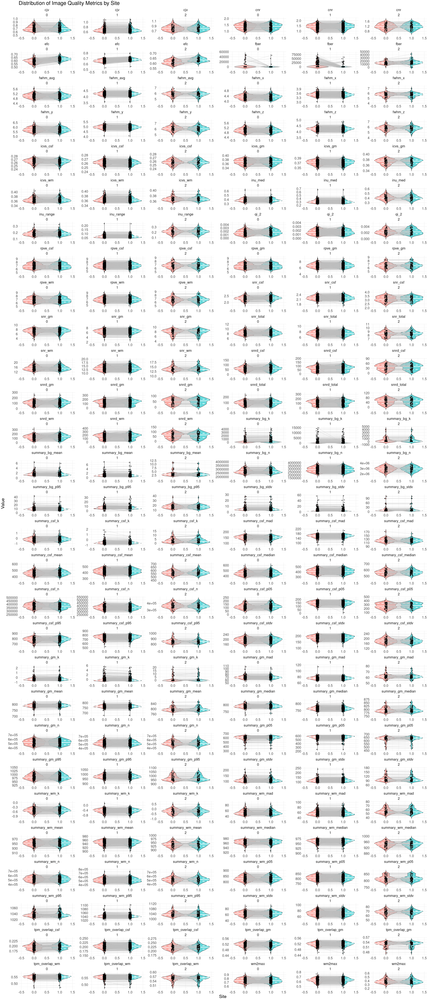

In [268]:
# For each IQMs, plot the distribution per site using ggplot
library(ggplot2)
library(tidyr)
library(dplyr)

# Increase plot size
options(repr.plot.width=30, repr.plot.height=70)

iqms_df_long <- iqms_df %>%
  pivot_longer(cols = setdiff(colnames(iqms_df), c('X', 'site', 'bids_name', 'sub', 'defaced')),
               names_to = "IQM",
               values_to = "value")

# Plot with grouped subplots for the same IQM
p <- ggplot(iqms_df_long, aes(x = defaced, y = value, group = defaced)) +
  geom_violin(aes(fill = as.factor(defaced)), trim = FALSE, scale = "width", alpha = 0.6) +
  stat_summary(fun = quantile, fun.args = list(probs = c(0.5)), geom = "crossbar", width=1, color="white") +
  stat_summary(fun = quantile, fun.args = list(probs = c(0.25, 0.75)), geom = "crossbar", width=1, color="white", linetype="dashed") +
  geom_line(aes(group = sub), color = 'gray', alpha = 0.5) +
  geom_point(position = position_jitter(width = 0.05), alpha = 0.6) +
  labs(title = "Distribution of Image Quality Metrics by Site",
       x = "Site",
       y = "Value") +
  theme_minimal() +
  theme(text = element_text(size = 22)) +
  theme(legend.position = "none") +
  facet_wrap(~ IQM + site, scales = "free", ncol = 6)

print(p)

#geom_violinhalf(aes(fill = defaced), trim = FALSE, scale = "count", alpha = 0.6, flip=c(0,1)) +

## Run the PCA separately per site

The fact that many IQMs are heavily correlated represents a violation of the independence assumption of MANOVA. To remedy to this issue, we run PCA on the IQMs to extract principal components. PCA is performed only on the IQMs coming from the non-defaced data and separately per site. That transform is applied to the IQMs from both the non-defaced and defaced data.

### Choose number of components for each site

To choose the number of principal components to keep, we will apply the Kaiser criterion which states to drop components with an eigenvalue lower than 1.0. It is useful to complement this approach with the scree plot to make a decision for the component with an eigenvalue close to 1.0, e.g the eigenvalue might be just below but the component explains a significant part of the variance.

[1] "Site: 0"
[1] "185 non-defaced images"
[1] "185 defaced images"
[1] "Eigenvalues:"
         PC1          PC2          PC3          PC4          PC5          PC6 
1.928154e+01 1.063282e+01 5.106401e+00 4.508504e+00 4.085168e+00 2.249250e+00 
         PC7          PC8          PC9         PC10         PC11         PC12 
1.848204e+00 1.432356e+00 1.364555e+00 1.094910e+00 9.075268e-01 7.627566e-01 
        PC13         PC14         PC15         PC16         PC17         PC18 
6.956153e-01 5.630231e-01 4.684817e-01 4.430425e-01 4.012870e-01 3.437608e-01 
        PC19         PC20         PC21         PC22         PC23         PC24 
2.950328e-01 2.415890e-01 2.202339e-01 1.984575e-01 1.687719e-01 1.280870e-01 
        PC25         PC26         PC27         PC28         PC29         PC30 
1.145418e-01 1.010172e-01 6.994082e-02 6.308697e-02 4.608529e-02 3.209825e-02 
        PC31         PC32         PC33         PC34         PC35         PC36 
2.775777e-02 2.168206e-02 1.706999e-02 1.275

Warning message:
“Removed 1 row containing missing values or values outside the scale range
(`geom_line()`).”
Warning message:
“Removed 1 row containing missing values or values outside the scale range
(`geom_point()`).”


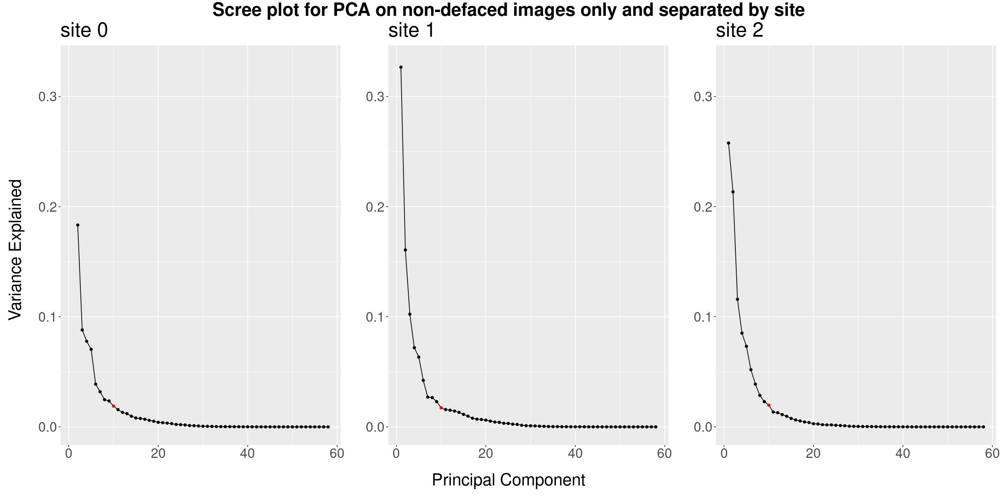

In [252]:
library(hash)
library(ggplot2)
library(gridExtra)
library(grid)

plots <- list()
nbr_pc_list <- hash()
for (site_idx in sort(unique(iqms_df$site))){
    df_nondefaced_site <- subset(iqms_df, defaced == 0 & site == site_idx)
    df_defaced_site <- subset(iqms_df, defaced == 1 & site == site_idx)

    # Standardize the IQMs
    iqms_nd_site <- subset(df_nondefaced_site, select= -c(X, bids_name, sub, defaced,site))
    means <- sapply(iqms_nd_site, mean)  # Calculate means of columns
    sds <- sapply(iqms_nd_site, sd)      # Calculate standard deviations of columns
  
    # Subtract the mean and divide the standard deviation of the IQMs from non-defaced images
    iqms_nd_site <- scale(iqms_nd_site, center = means, scale = sds)
    
    print(paste('Site:', site_idx))
    print(paste(nrow(df_nondefaced_site), 'non-defaced images'))
    print(paste(nrow(df_defaced_site), 'defaced images'))

    pca_nondefaced <- prcomp(iqms_nd_site, scale=FALSE, retx=TRUE)

    print('Eigenvalues:')
    print(eigenvalues <- diag(cov(pca_nondefaced$x)))
    # Define the number of components to keep as the component previous the first component with an eigenvalue lower than 1
    nbr_pc <- which(eigenvalues < 1)[1] - 1
    nbr_pc_list[[as.character(site_idx)]] <- nbr_pc

    #calculate total variance explained by each principal component
    var_explained_o = pca_nondefaced$sdev^2 / sum(pca_nondefaced$sdev^2)

    #create scree plot
    # Highlight the number of components selected by the Kaiser criterion
    highlight_point <- ifelse(c(1:length(var_explained_o)) == nbr_pc, "#ff0000", "black")

    q <- ggplot(data = data.frame(PC = 1:length(var_explained_o), Variance = var_explained_o), aes(x = PC, y = Variance)) +  
      geom_line() + 
      geom_point(color = highlight_point) +
      xlab("") +
      ylab("") +
      ggtitle(sprintf("site %s", site_idx)) +
      theme(text = element_text(size = 24)) +
      ylim(range(0,0.33))

    plots[[length(plots) + 1]] <- q
}
#Increase plot size
options(repr.plot.width=20, repr.plot.height=10)

# Combine all the plots into one with a supertitle
combined_plot <- arrangeGrob(grobs = plots, nrow = 1)

# Add a supertitle and a common x and y label
title_grob <- textGrob("Scree plot for PCA on non-defaced images only and separated by site", gp = gpar(fontsize = 26, fontface = "bold"))
x_grob <- textGrob("Principal Component", gp = gpar(fontsize = 24), vjust = -0.5)
y_grob <- textGrob("Variance Explained", gp = gpar(fontsize = 24), rot = 90, vjust = 1)

# Draw the final plot
final_plot <- arrangeGrob(top= title_grob, bottom = x_grob, left= y_grob, combined_plot, ncol = 1)
grid.newpage()
grid.draw(final_plot)

In [253]:
print('Number of components to keep per site:')
print(nbr_pc_list)

[1] "Number of components to keep per site:"
<hash> containing 3 key-value pair(s).
  0 : 10
  1 : 10
  2 : 10


### Rerun PCA with the decided number of components

To be able to precise the rm-MANOVA model we need to have the same number of components across the three sites. Since the amount of variance explained by the 11th principal component in site 0 is small, we decide to keep 10 components corresponding to the number of components selected for site 1 and 2.

In [254]:
projected_iqms_df <- data.frame()
df_nd_st <- data.frame()
df_d_st <- data.frame()

for (site_idx in sort(unique(iqms_df$site))){ 
    df_nondefaced_site <- subset(iqms_df, defaced == 0 & site == site_idx)
    df_defaced_site <- subset(iqms_df, defaced == 1 & site == site_idx) 
    
    ## Standardize the IQMs
    iqms_nd_site <- subset(df_nondefaced_site, select= -c(X, bids_name, sub, defaced,site))
    iqms_d_site <- subset(df_defaced_site, select= -c(X, bids_name, sub, defaced,site))
    means <- sapply(iqms_nd_site, mean)  # Calculate means of columns
    sds <- sapply(iqms_nd_site, sd)      # Calculate standard deviations of columns
  
    # Subtract the mean and divide the standard deviation of the IQMs from non-defaced images
    iqms_nd_site <- as.data.frame(scale(iqms_nd_site, center = means, scale = sds))
    iqms_d_site <- as.data.frame(scale(iqms_d_site, center = means, scale = sds))

    info_col_nd <- subset(df_nondefaced_site, select= c(bids_name, sub, defaced, site))
    info_col_d <- subset(df_defaced_site, select= c(bids_name, sub, defaced, site))
  
    # Recombine the information and sites
    df_nd_st <- rbind(df_nd_st, cbind(iqms_nd_site, info_col_nd))
    df_d_st <- rbind(df_d_st, cbind(iqms_d_site, info_col_d))

    ## PCA
    pca_nondefaced <- prcomp(iqms_nd_site, scale=FALSE, retx=TRUE, rank=10)
    #Combine the projected IQMs into a dataframe
    projected_nd_df <- data.frame(sub = df_nondefaced_site$sub, pca_nondefaced$x, defaced = df_nondefaced_site$defaced, site = df_nondefaced_site$site)

    #Project defaced IQMS onto the PCA basis
    rotated_defaced <- as.matrix(iqms_d_site) %*% pca_nondefaced$rotation
    projected_d_df <- data.frame(sub = df_defaced_site$sub, rotated_defaced, defaced = df_defaced_site$defaced, site = df_defaced_site$site)

    #Recombine the dataframes
    projected_iqms_df <- rbind(projected_iqms_df, projected_nd_df, projected_d_df)
}
nrow(projected_iqms_df)
head(projected_iqms_df)

[1] 1158

,sub,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,defaced,site
,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<int>
1,12,-4.767491,4.6447694,1.5394388,3.1864908,-0.6544279,-0.9933460,0.43755399,-0.6500271,-1.2059647,1.9138416,0,0
2,13,-0.926888,1.0972963,0.9026791,2.2139493,2.1895724,0.5816991,-1.50420737,0.4923380,-0.1167393,1.5433725,0,0
3,14,-5.097060,-4.4992263,2.1478385,5.1578395,-0.1913250,-0.7561971,0.48900037,0.6698990,-1.6873581,-1.3390399,0,0
4,15,-3.015223,0.7677999,0.6642192,2.1170775,0.6931764,1.0683356,-1.20822911,-0.2580789,-0.9489848,-1.0317094,0,0
5,33,-6.423710,0.2476009,2.0554603,0.8028899,1.2547083,-1.4774733,-0.22912049,-1.0083434,-0.4127104,0.5267351,0,0
6,34,-4.520858,0.4297380,-0.3581469,0.6192391,0.7241467,-2.2500068,-0.04364318,0.6559118,-0.8008926,-0.8356862,0,0


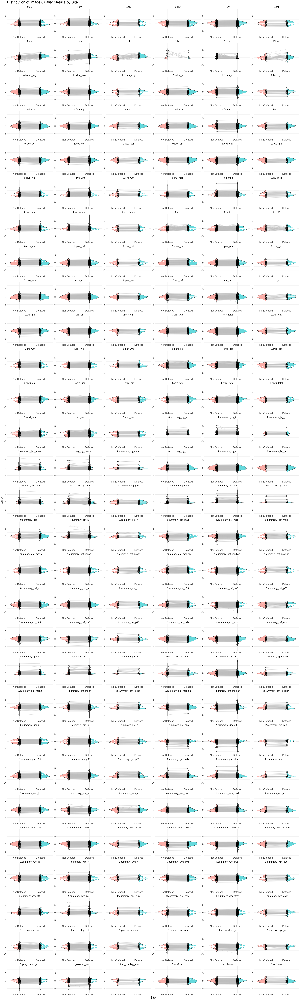

In [255]:
# Plot size
options(repr.plot.width=30, repr.plot.height=100)
plot_iqms(rbind(df_nd_st, df_d_st))

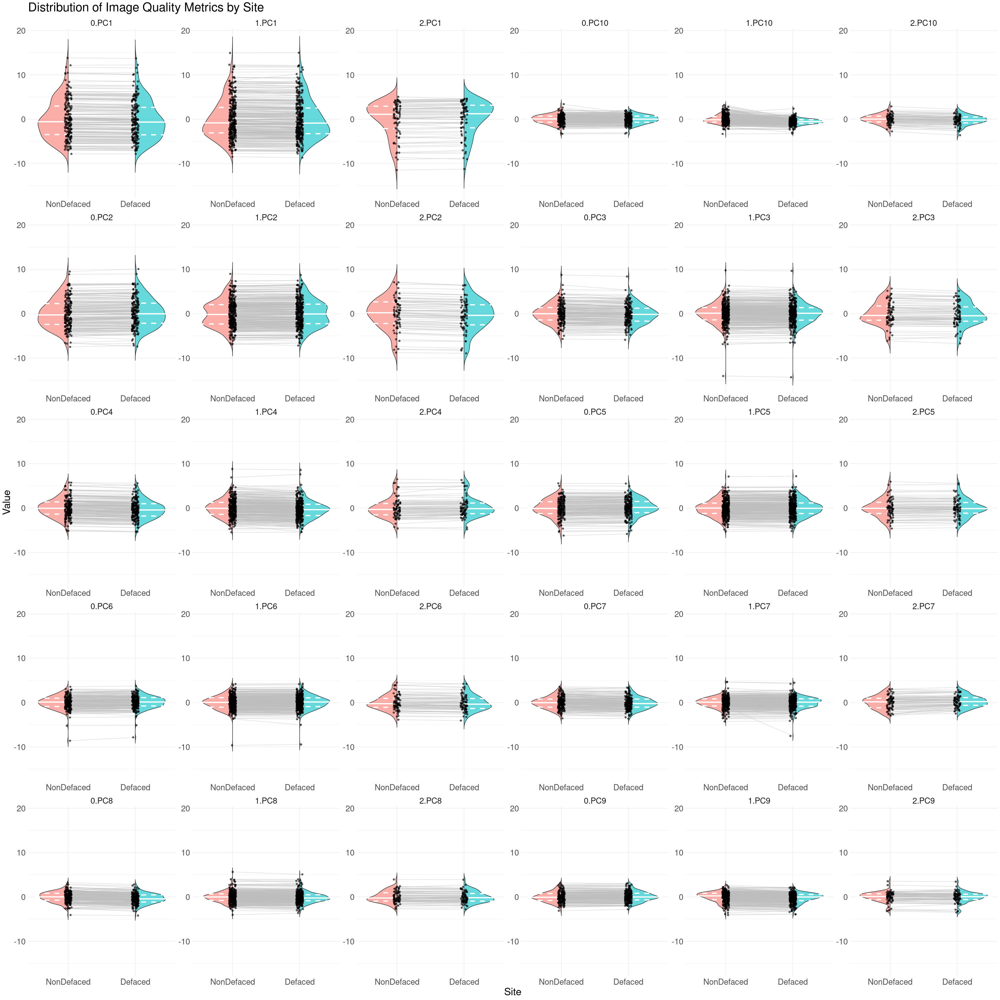

In [256]:
# Plot size
options(repr.plot.width=30, repr.plot.height=30)
plot_iqms(as.data.frame(projected_iqms_df))

## Run MANOVA

In [257]:
library(MANOVA.RM)

#Construct formula
dep_var <- ''
col_names <- colnames(projected_iqms_df)
#Remove non-iqms column names
iqms_keys <- col_names[c(-1,-length(col_names),-length(col_names)+1)]
for (key in iqms_keys){
    dep_var <- paste(dep_var, sprintf('%s +',key))
}
dep_var = substring(dep_var,1, nchar(dep_var)-2)

my_formula <- as.formula(paste(dep_var, " ~ site + defaced"))
my_formula

fit <- multRM(my_formula, data = projected_iqms_df, subject = 'sub', within = 'defaced')
summary(fit)

PC1 + PC2 + PC3 + PC4 + PC5 + PC6 + PC7 + PC8 + PC9 + PC10 ~ 
    site + defaced

Call: 
PC1 + PC2 + PC3 + PC4 + PC5 + PC6 + PC7 + PC8 + PC9 + PC10 ~ 
    site + defaced
A multivariate repeated measures analysis with  1 within-subject factor(s) ( defaced )and  1 between-subject factor(s). 

Descriptive:
  site defaced   n PC1 + PC2 + PC3 + PC4 + PC5 + PC6 + PC7 + PC8 + PC9 + PC10
1    0       0 185                                                      0.000
2    0       1 185                                                     -0.714
3    1       0 320                                                      0.000
4    1       1 320                                                     -1.320
5    2       0  74                                                      0.000
6    2       1  74                                                     -0.428

Wald-Type Statistic (WTS):
        Test statistic df  p-value 
site    "0.358"        "2" "0.836" 
defaced "181.182"      "1" "<0.001"

modified ANOVA-Type Statistic (MATS):
        Test statistic
site             0.710
defaced   

## Run PCA on all non-defaced images pooled across sites

In [258]:
#Separate IQMs from the defaced and non-defaced condition
df_nondefaced <- subset(iqms_df, defaced == 0)
df_defaced <- subset(iqms_df, defaced == 1)

#Standardize the IQMs per site
df_nd_st <- data.frame()
df_d_st <- data.frame()
for (site_idx in sort(unique(iqms_df$site))){
    info_col_nd <- subset(df_nondefaced, site == site_idx, select= c(bids_name, sub, defaced, site))
    info_col_d <- subset(df_defaced, site == site_idx, select= c(bids_name, sub, defaced, site))
    iqms_nd_site <- subset(df_nondefaced, site == site_idx, select= -c(X, bids_name, sub, defaced,site))
    iqms_d_site <- subset(df_defaced, site == site_idx, select = -c(X, bids_name, sub, defaced, site))
    means <- sapply(iqms_nd_site, mean)  # Calculate means of columns
    sds <- sapply(iqms_nd_site, sd)      # Calculate standard deviations of columns
  
    # Subtract the mean and divide the standard deviation of the IQMs from non-defaced images
    df_nd_site_st <- cbind(as.data.frame(scale(iqms_nd_site, center = means, scale = sds)), info_col_nd)
    df_d_site_st <- cbind(as.data.frame(scale(iqms_d_site, center = means, scale = sds)), info_col_d)

    # Recombine the sites
    df_nd_st <- rbind(df_nd_st, df_nd_site_st)
    df_d_st <- rbind(df_d_st, df_d_site_st)
}

iqms_nd_st <- subset(df_nd_st, select = -c(bids_name, sub, defaced, site))
iqms_d_st <- subset(df_d_st, select = -c(bids_name, sub, defaced, site))

pca_nondefaced <- prcomp(iqms_nd_st, scale=FALSE, retx=TRUE)

### Choose number of principal components

To choose the number of principal components to keep, we will apply the Kaiser criterion which states to drop components with an eigenvalue lower than 1.0. It is useful to complement this approach with the scree plot to make a decision for the component with an eigenvalue close to 1.0, e.g the eigenvalue might be just below but the component explains a significant part of the variance.

In [259]:
#Extract eigenvalues
diag(cov(pca_nondefaced$x))

PC1          PC2          PC3          PC4          PC5          PC6 
1.770482e+01 9.828037e+00 5.224984e+00 4.080428e+00 3.994763e+00 2.622547e+00 
         PC7          PC8          PC9         PC10         PC11         PC12 
1.808365e+00 1.713010e+00 1.370401e+00 9.533431e-01 9.163010e-01 8.093596e-01 
        PC13         PC14         PC15         PC16         PC17         PC18 
7.589951e-01 7.533390e-01 6.668426e-01 5.622586e-01 5.193354e-01 4.159153e-01 
        PC19         PC20         PC21         PC22         PC23         PC24 
4.038708e-01 3.943228e-01 3.560245e-01 2.972399e-01 2.676274e-01 2.339312e-01 
        PC25         PC26         PC27         PC28         PC29         PC30 
2.006598e-01 1.649475e-01 1.438138e-01 1.095923e-01 9.183626e-02 7.085679e-02 
        PC31         PC32         PC33         PC34         PC35         PC36 
6.282610e-02 5.104822e-02 3.899708e-02 3.599734e-02 3.059335e-02 2.881586e-02 
        PC37         PC38         PC39         PC40         PC41         PC42 
2.371593e-02 1.869733e-02 1.633410e-02 1.082646e-02 8.060956e-03 7.110046e-03 
        PC43         PC44         PC45         PC46         PC47         PC48 
5.728217e-03 5.654979e-03 4.393590e-03 3.122908e-03 2.685924e-03 1.687651e-03 
        PC49         PC50         PC51         PC52         PC53         PC54 
1.650073e-03 1.293699e-03 8.871751e-04 6.273457e-04 4.159689e-04 2.464459e-04 
        PC55         PC56         PC57         PC58 
1.165749e-04 4.680694e-06 2.039946e-06 1.144389e-06

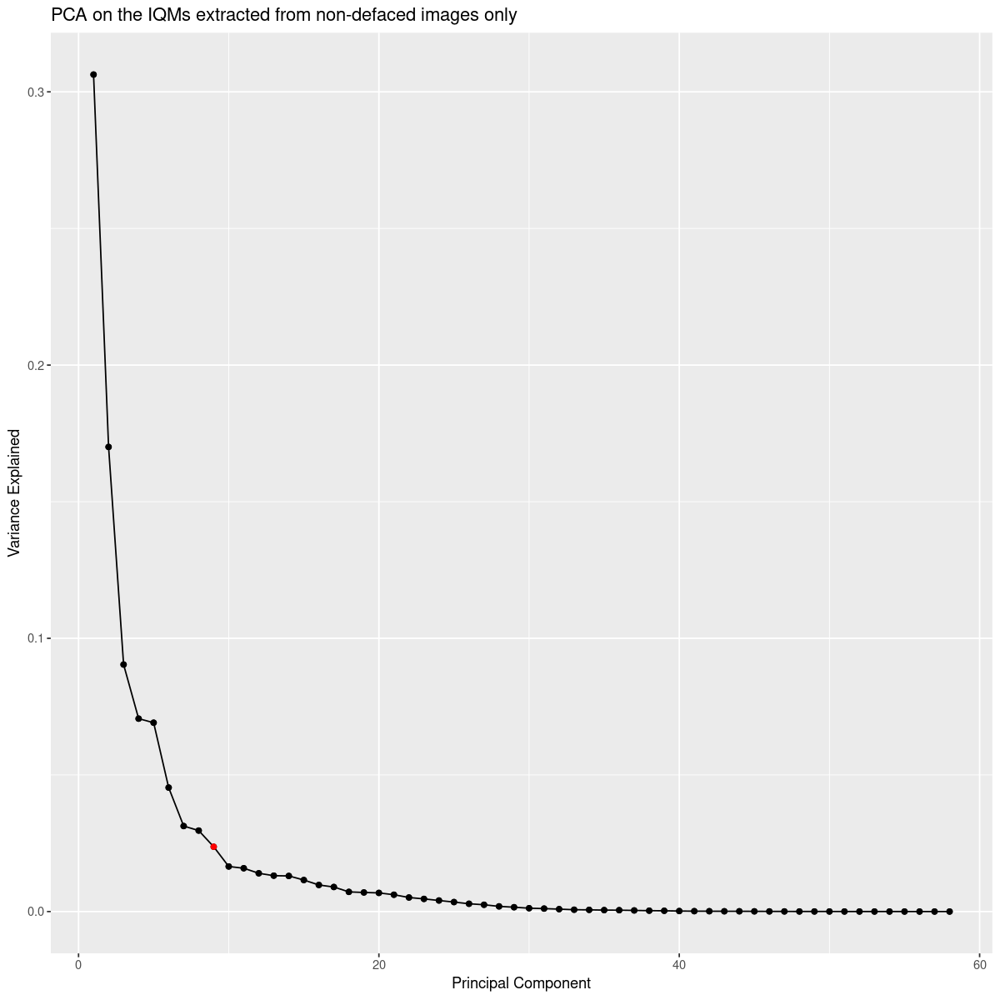

In [260]:
#Increase plot size
options(repr.plot.width=10, repr.plot.height=10)

#calculate total variance explained by each principal component
var_explained_o = pca_nondefaced$sdev^2 / sum(pca_nondefaced$sdev^2)

#create scree plot
library(ggplot2)

# Highlight the number of components selected by the Kaiser criterion
highlight_point <- ifelse(c(1:length(var_explained_o)) == 9, "#ff0000", "black")

qplot(c(1:length(var_explained_o)), var_explained_o) +  
  geom_line() + 
  geom_point(color = highlight_point) +
  xlab("Principal Component") + 
  ylab("Variance Explained") +
  ggtitle("PCA on the IQMs extracted from non-defaced images only")

The Kaiser criterion informs to keep only the 9 first components in the nondefaced case. Furthermore, the components around 10 do not explain a significant part of the variance according to the scree plot. We can thus apply the cut-off of keeping the 9 first principal components.

### Rerun PCA with the decided nbr of components

In [261]:
pca_nondefaced <- prcomp(iqms_nd_st, scale=FALSE, retx=TRUE, rank=9)

#Project defaced IQMS onto the PCA basis
rotated_defaced <- as.matrix(iqms_d_st) %*% pca_nondefaced$rotation

#Combine IQMs projected onto the PCA basis
projected_iqms <- rbind(pca_nondefaced$x, rotated_defaced)

#Recombine the projected IQMs into a dataframe
defaced <- c(df_nd_st$defaced, df_d_st$defaced)
site <- c(df_nd_st$site, df_d_st$site)
sub <- c(df_nd_st$sub, df_d_st$sub)
projected_iqms_df <- cbind(sub, projected_iqms, defaced, site)
nrow(projected_iqms_df)
head(projected_iqms_df)

# Save the projected IQMs
write.csv(projected_iqms_df, file = "IXI_projected_iqms_df.csv")


[1] 1158

,sub,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,defaced,site
1,12,-4.4174173,-4.5566292,-2.8858109,-0.5605507,3.0032737,-0.1250821,0.9254283,0.5876532,0.6963343,0,0
2,13,-0.6237569,-1.1698977,-1.2313729,2.4720738,1.1441047,-1.4843553,0.9363893,-0.2356593,-1.4800500,0,0
3,14,-4.8005130,4.4081622,-4.6567902,1.0937047,3.7335957,0.2447619,1.3175190,-0.1643379,-0.2214358,0,0
4,15,-2.5769052,-0.6911699,-1.6208522,1.4996816,1.8290891,-1.6411135,0.1606906,0.8602246,0.5759405,0,0
5,33,-6.1572283,-0.5130112,-2.4374681,0.5397923,-0.2497783,-0.8883501,1.8444351,-0.2433510,0.6799773,0,0
6,34,-4.6846183,-0.7218497,-0.4235198,0.6032355,0.4111205,0.8359595,1.7563025,0.2495941,-0.2157489,0,0


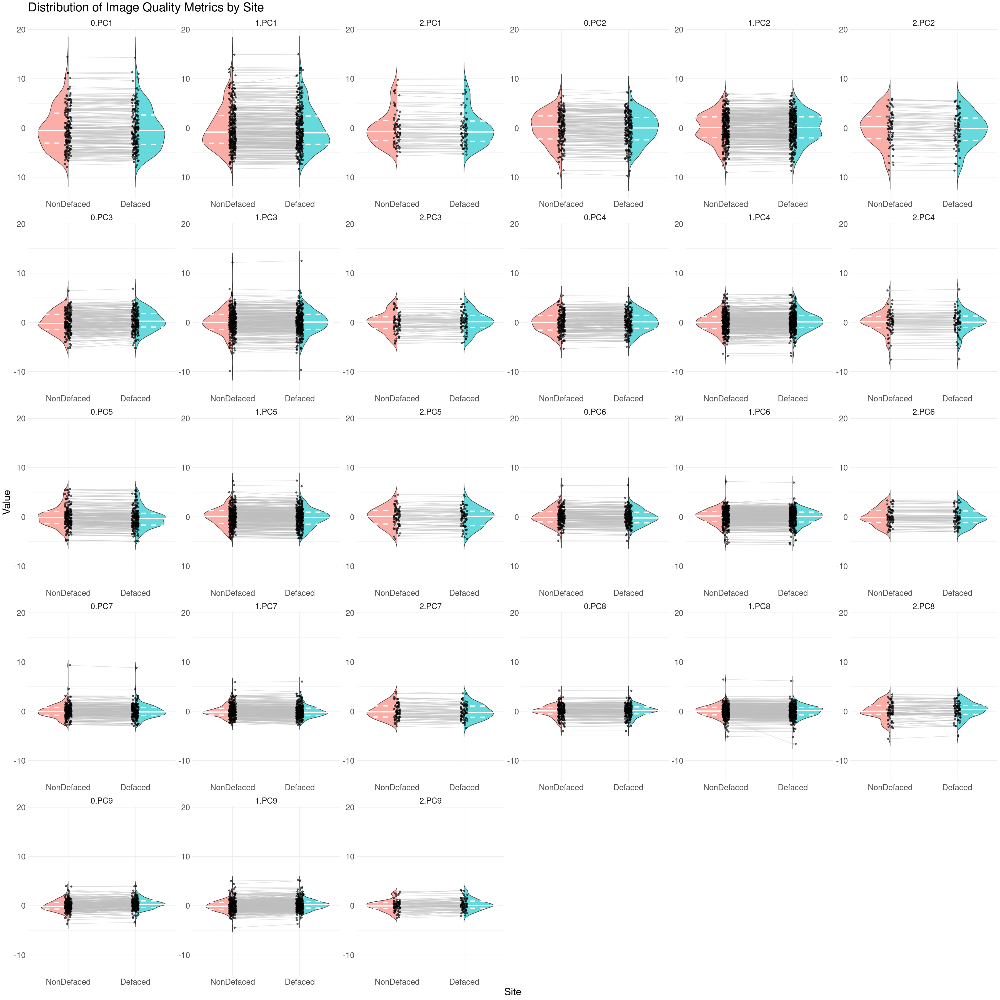

In [262]:
# Plot size
options(repr.plot.width=30, repr.plot.height=30)
plot_iqms(as.data.frame(projected_iqms_df))

## Run MANOVA

In [263]:
library(MANOVA.RM)

#Construct formula
dep_var <- ''
col_names <- colnames(projected_iqms_df)
#Remove non-iqms column names
iqms_keys <- col_names[c(-1,-length(col_names),-length(col_names)+1)]
for (key in iqms_keys){
    dep_var <- paste(dep_var, sprintf('%s +',key))
}
dep_var = substring(dep_var,1, nchar(dep_var)-2)

my_formula <- as.formula(paste(dep_var, " ~ site + defaced"))
my_formula

fit <- multRM(my_formula, data = projected_iqms_df, subject = 'sub', within = 'defaced')
summary(fit)
#eta_squared(fit, partial = TRUE)

PC1 + PC2 + PC3 + PC4 + PC5 + PC6 + PC7 + PC8 + PC9 ~ site + 
    defaced

Call: 
PC1 + PC2 + PC3 + PC4 + PC5 + PC6 + PC7 + PC8 + PC9 ~ site + 
    defaced
A multivariate repeated measures analysis with  1 within-subject factor(s) ( defaced )and  1 between-subject factor(s). 

Descriptive:
  site defaced   n PC1 + PC2 + PC3 + PC4 + PC5 + PC6 + PC7 + PC8 + PC9
1    0       0 185                                               0.000
2    0       1 185                                               0.062
3    1       0 320                                               0.000
4    1       1 320                                              -0.020
5    2       0  74                                               0.000
6    2       1  74                                              -0.152

Wald-Type Statistic (WTS):
        Test statistic df  p-value
site    "0.011"        "2" "0.994"
defaced "1.038"        "1" "0.308"

modified ANOVA-Type Statistic (MATS):
        Test statistic
site             0.023
defaced          0.005

p-values resampling:
        paramBS (WTS) pa

# Does defacing reduce the reliability of the IQMs?

We quantify the IQMs reliability using coefficient of variation (CoV) and compare the distribution of the CoV computed on the IQMs extracted from non-defaced versus defaced images.

In [264]:
# Compute coefficient of variation of each IQM in defaced and non-defaced conditions
cov_nd <- sapply(subset(df_nondefaced, select= -c(X, bids_name, sub, defaced, site)), function(x) sd(x) / mean(x) * 100)
cov_d <- sapply(subset(df_defaced, select= -c(X, bids_name, sub, defaced, site)), function(x) sd(x) / mean(x) * 100)

# Perform repeated-measures t-test to compare the CoV distributions
t.test(cov_nd, cov_d, paired = TRUE, alternative = "two.sided")



	Paired t-test

data:  cov_nd and cov_d
t = 0.46125, df = 57, p-value = 0.6464
alternative hypothesis: true mean difference is not equal to 0
95 percent confidence interval:
 -11.43612  18.28122
sample estimates:
mean difference 
       3.422552 


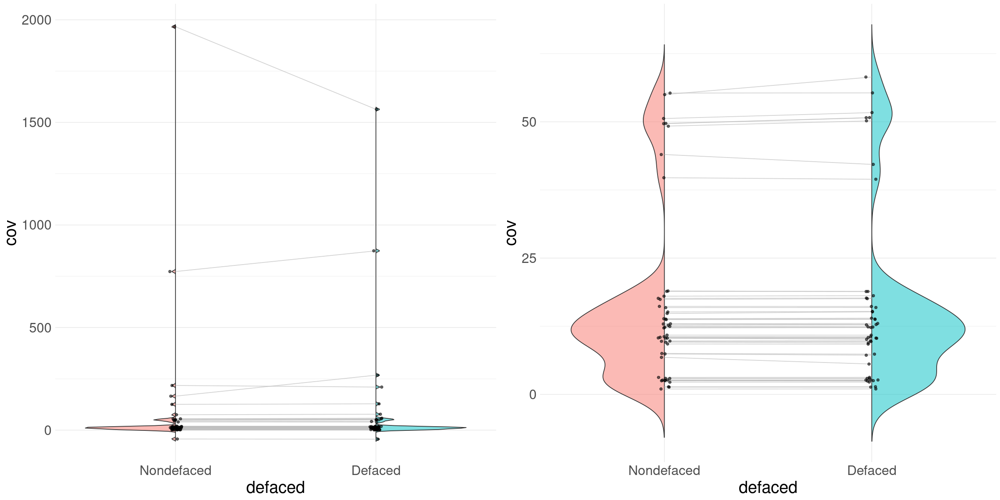

In [265]:
library(see)
library(gridExtra)
#Increase plot size
options(repr.plot.width=20, repr.plot.height=10)

cov_nd_df <- data.frame(cov = cov_nd, defaced = 0, iqms = names(cov_nd))
cov_d_df <- data.frame(cov = cov_d, defaced = 1, iqms = names(cov_d))

# Combine the two data frames
cov_df <- rbind(cov_nd_df, cov_d_df)
cov_df$defaced <- factor(cov_df$defaced, levels = c(0, 1), labels = c("Nondefaced", "Defaced"))

p1 <- ggplot(cov_df, aes(x = defaced, y = cov, group = defaced)) +
  geom_violinhalf(aes(fill = defaced), alpha = 0.5, flip=c(0, 1), trim = FALSE, scale = "width") +
  geom_line(aes(group = iqms), color = 'gray', alpha = 0.7) +
  geom_point(position = position_jitter(width = 0.03), alpha = 0.6) +
  theme_minimal() +
  theme(text = element_text(size = 24)) +
  theme(legend.position = "none") 

p2 <- ggplot(subset(cov_df, cov<75 & cov>-10), aes(x = defaced, y = cov, group = defaced)) +
  geom_violinhalf(aes(fill = defaced), alpha = 0.5, flip=c(0, 1), scale = "width", trim = FALSE) +
  geom_line(aes(group = iqms), color = 'gray', alpha = 0.7) +
  geom_point(position = position_jitter(width = 0.03), alpha = 0.6) +
  theme_minimal() +
  theme(text = element_text(size = 24)) +
  theme(legend.position = "none")

grid.arrange(p1, p2, nrow = 1)

## Comparison of the covariance matrices

In [266]:
library(heplots)

boxM(iqms_df[,4:ncol(iqms_df)-1], iqms_df[,ncol(iqms_df)])

ERROR: Error in boxM.default(iqms_df[, 4:ncol(iqms_df) - 1], iqms_df[, ncol(iqms_df)]): incompatible dimensions in Y and group!


Box's (1949) M-test tests for homogeneity of covariance matrices. The null hypothesis for this test is that the observed covariance matrices are equal across groups. In other words, a non-significant test result indicates that the covariance matrices are equal.